In [ ]:
import os
import matplotlib.pyplot as plt
import itertools
import pickle
import imageio
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torchvision.utils import save_image, make_grid
import torchvision
import os, time
import matplotlib.pyplot as plt
import itertools
import pickle
import imageio
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
import cv2

# W-GAN

In [ ]:
import torch
import torch.nn as nn
from torchsummary import summary
import torch
import itertools
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
device = "cuda" if torch.cuda.is_available() else "cpu"
import os
import time

In [ ]:
!unzip robots.zip

Archive:  robots.zip
   creating: robots/
   creating: robots/train/
   creating: robots/train/nrbt/
  inflating: robots/train/nrbt/no_robot_10.jpg  
  inflating: robots/train/nrbt/no_robot_15.jpg  
  inflating: robots/train/nrbt/no_robot_19.jpg  
  inflating: robots/train/nrbt/no_robot_22.jpg  
  inflating: robots/train/nrbt/no_robot_23.jpg  
  inflating: robots/train/nrbt/no_robot_24.jpg  
  inflating: robots/train/nrbt/no_robot_25.jpg  
  inflating: robots/train/nrbt/no_robot_27.jpg  
  inflating: robots/train/nrbt/no_robot_28.jpg  
  inflating: robots/train/nrbt/no_robot_3.jpg  
  inflating: robots/train/nrbt/no_robot_31.jpg  
  inflating: robots/train/nrbt/no_robot_32.jpg  
  inflating: robots/train/nrbt/no_robot_33.jpg  
  inflating: robots/train/nrbt/no_robot_35.jpg  
  inflating: robots/train/nrbt/no_robot_36.jpg  
  inflating: robots/train/nrbt/no_robot_37.jpg  
  inflating: robots/train/nrbt/no_robot_39.jpg  
  inflating: robots/train/nrbt/no_robot_4.jpg  
  inflating: robots

## Generator and Discriminator

In [ ]:
# Similar to DCGAN implementation but with removed sigmoid in the final layer

class WGANcritic(nn.Module):
  def __init__(self, d  = 128):
    super(WGANcritic, self).__init__()
    self.conv1 =  nn.Conv2d(3, d, kernel_size=  4,  stride = 2, padding=1)
    self.leaky_relu = nn.LeakyReLU(0.2)

    self.conv2 = nn.Conv2d(d, d*2, 4,  2, 1, bias= False)
    self.inst_norm2 = nn.InstanceNorm2d(d*2, affine = True)

    self.conv3 = nn.Conv2d(d*2, d*4, 4,  2, 1, bias= False)
    self.inst_norm3 = nn.InstanceNorm2d(d*4, affine = True)

    self.conv4 = nn.Conv2d(d*4, d*8, 4,  2, 1, bias= False)
    self.inst_norm4 = nn.InstanceNorm2d(d*8, affine = True)

    self.conv5  = nn.Conv2d(d*8, 1 ,4, 2, 0)

  def forward(self, x):
    x = self.leaky_relu(self.conv1(x))
    x = self.leaky_relu(self.inst_norm2(self.conv2(x)))
    x = self.leaky_relu(self.inst_norm3(self.conv3(x)))
    x = self.leaky_relu(self.inst_norm4(self.conv4(x)))
    x = self.conv5(x)
    return x
    

In [ ]:
class WGANgen(nn.Module):
  def __init__(self, d):
    super(WGANgen, self).__init__()
    self.convtrans1 =  nn.ConvTranspose2d(100, d*16, 4,  1, 0)
    self.bn1  = nn.BatchNorm2d(d*16)
    self.relu = nn.ReLU()

    self.convtrans2 =  nn.ConvTranspose2d(d*16, d*8, 4,  2, 1)
    self.bn2  = nn.BatchNorm2d(d*8)
    #self.relu = nn.ReLU()

    self.convtrans3 =  nn.ConvTranspose2d(d*8, d*4, 4,  2, 1)
    self.bn3  = nn.BatchNorm2d(d*4)
    #self.relu = nn.ReLU()

    self.convtrans4 =  nn.ConvTranspose2d(d*4, d*2, 4,  2, 1)
    self.bn4  = nn.BatchNorm2d(d*2)
    #self.relu = nn.ReLU()
    
    self.convtrans5 = nn.ConvTranspose2d(d*2, 3, 4, 2, 1)
    self.tan = nn.Tanh()

  def forward(self, x):

    x = self.relu(self.bn1(self.convtrans1(x)))
    x = self.relu(self.bn2(self.convtrans2(x)))
    x = self.relu(self.bn3(self.convtrans3(x)))
    x = self.relu(self.bn4(self.convtrans4(x)))

    x = self.tan(self.convtrans5(x))

    return x

In [ ]:
def init_weights(model):
  for m in model.modules():
    if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d, nn.BatchNorm2d)):
      nn.init.normal_(m.weight.data,0.0,0.02)

## Define Show result and train hist

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def show_result(num_epoch, show = False, save = False, path = 'result.png', isFix=False):

    z_ = torch.randn((5*5, 100)).view(-1, 100, 1, 1)
    z_ = z_.cuda()

    gen.eval()
    if isFix:
        test_images = gen(fixed_z_)
    else:
        test_images = gen(z_)
    gen.train()
    
    size_figure_grid = 5
    fig, ax = plt.subplots(size_figure_grid, size_figure_grid, figsize=(5, 5))
    for i, j in itertools.product(range(size_figure_grid), range(size_figure_grid)):
        ax[i, j].get_xaxis().set_visible(False)
        ax[i, j].get_yaxis().set_visible(False)

    for k in range(5*5):
        i = k // 5
        j = k % 5
        #print(test_images[k].shape)
        ax[i, j].cla()
        ax[i, j].imshow((np.transpose(test_images[k].cpu().data.numpy(),(1,2,0))*255).astype(np.uint8))

    label = 'Epoch {0}'.format(num_epoch)
    fig.text(0.5, 0.04, label, ha='center')
    plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()


In [ ]:
def show_train_hist(hist, show = False, save = False, path = 'Train_hist.png'):
    x = range(len(hist['D_losses']))

    y1 = hist['D_losses']
    y2 = hist['G_losses']

    plt.plot(x, y1, label='D_loss')
    plt.plot(x, y2, label='G_loss')

    plt.xlabel('Iter')
    plt.ylabel('Loss')

    plt.legend(loc=4)
    plt.grid(True)
    plt.tight_layout()

    if save:
        plt.savefig(path)

    if show:
        plt.show()
    else:
        plt.close()

## Dataloader

In [ ]:
# Data augmentation and normalization for training
# Just normalization for validation

# training parameters
batch_size = 25
lr = 1e-4
train_epoch = 100

# data_loader

data_transforms = {
    'train': transforms.Compose([
        #transforms.RandomResizedCrop(224),
        #transforms.RandomHorizontalFlip(),
        transforms.Resize((64,64)),
        transforms.ToTensor(),
        #transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        #transforms.Resize(256),
        #transforms.CenterCrop(224),
        transforms.Resize((64,64)),
        transforms.ToTensor(),
        #transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

data_dir = 'robots'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
train_loaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size,
                                             shuffle=True, num_workers=4)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}

#image_datasets['train'].classes = ['not_robot', 'robot']

class_names = image_datasets['train'].classes

avDev = torch.device("cuda")

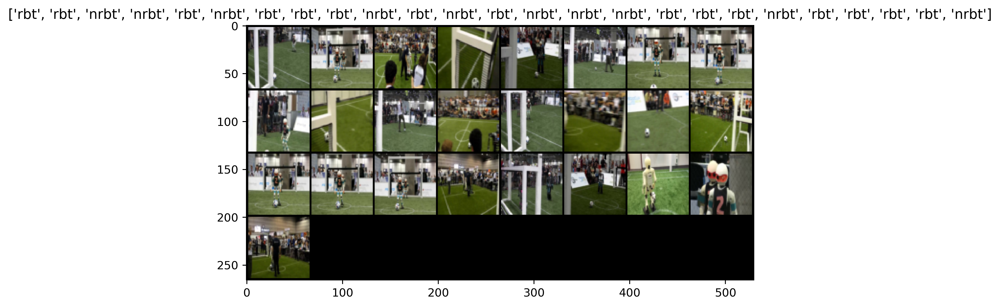

In [ ]:
from matplotlib.pyplot import figure
def sampleshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    
    figure(num=None, figsize=(8, 8), dpi=360, facecolor='w', edgecolor='k')
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(train_loaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

sampleshow(out, title=[class_names[x] for x in classes])

In [ ]:
gen = WGANgen(64).to(device)
critic = WGANcritic(16).to(device)

print(summary(gen, input_size = (100,1,1)) )

print(summary(critic, input_size = (3,64,64)) )


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1           [-1, 1024, 4, 4]       1,639,424
       BatchNorm2d-2           [-1, 1024, 4, 4]           2,048
              ReLU-3           [-1, 1024, 4, 4]               0
   ConvTranspose2d-4            [-1, 512, 8, 8]       8,389,120
       BatchNorm2d-5            [-1, 512, 8, 8]           1,024
              ReLU-6            [-1, 512, 8, 8]               0
   ConvTranspose2d-7          [-1, 256, 16, 16]       2,097,408
       BatchNorm2d-8          [-1, 256, 16, 16]             512
              ReLU-9          [-1, 256, 16, 16]               0
  ConvTranspose2d-10          [-1, 128, 32, 32]         524,416
      BatchNorm2d-11          [-1, 128, 32, 32]             256
             ReLU-12          [-1, 128, 32, 32]               0
  ConvTranspose2d-13            [-1, 3, 64, 64]           6,147
             Tanh-14            [-1, 3,

In [ ]:
init_weights(gen)
init_weights(critic)

In [ ]:
# results save folder
if not os.path.isdir('WGAN_results'):
    os.mkdir('WGAN_results')
if not os.path.isdir('WGAN_results/Random_results'):
    os.mkdir('WGAN_results/Random_results')
if not os.path.isdir('WGAN_results/Fixed_results'):
    os.mkdir('WGAN_results/Fixed_results')


In [ ]:
# initialize optimizers:

opt_gen = optim.RMSprop(gen.parameters(), lr= lr)
opt_critic = optim.RMSprop(critic.parameters(), lr= lr)

In [ ]:
fixed_z_ = torch.randn((5 * 5, 100)).view(-1, 100, 1, 1)    # fixed noise
fixed_z_ = fixed_z_.to(device)

## Training

training start!
[1/100] - ptime: 2.14, loss_d: -0.001, loss_g: -0.004


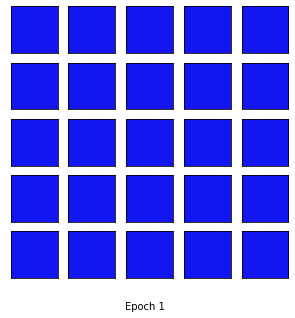

[2/100] - ptime: 1.98, loss_d: -0.001, loss_g: -0.004


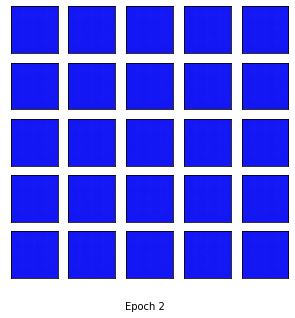

[3/100] - ptime: 2.11, loss_d: -0.001, loss_g: -0.003


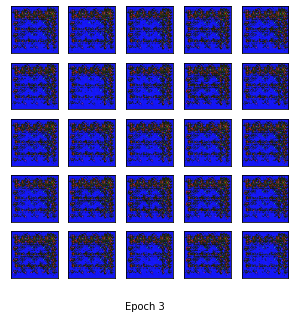

[4/100] - ptime: 2.07, loss_d: -0.002, loss_g: -0.003


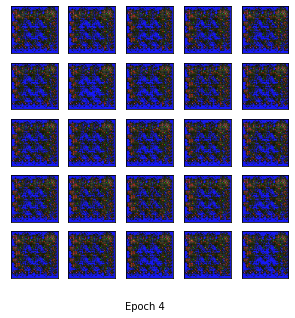

[5/100] - ptime: 2.12, loss_d: -0.002, loss_g: -0.003


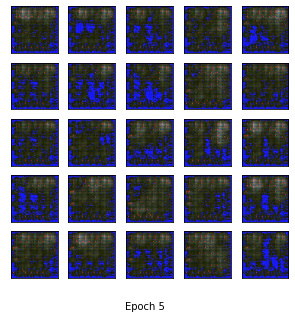

[6/100] - ptime: 2.04, loss_d: -0.003, loss_g: -0.004


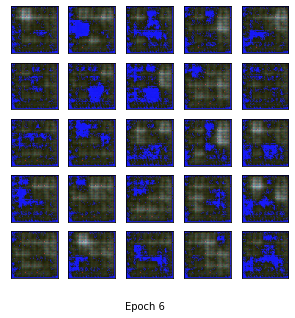

[7/100] - ptime: 2.01, loss_d: -0.004, loss_g: -0.004


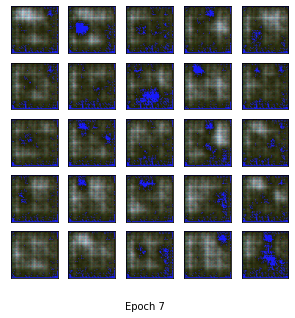

[8/100] - ptime: 2.00, loss_d: -0.005, loss_g: -0.005


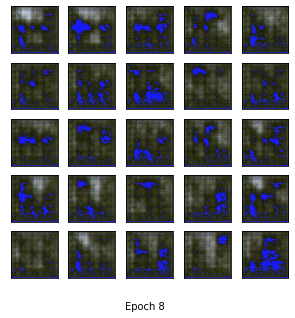

[9/100] - ptime: 2.13, loss_d: -0.004, loss_g: -0.005


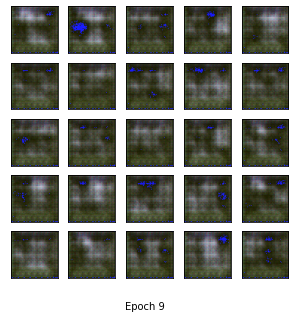

[10/100] - ptime: 1.90, loss_d: -0.006, loss_g: -0.005


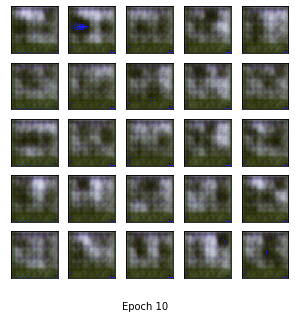

[11/100] - ptime: 2.09, loss_d: -0.007, loss_g: -0.004


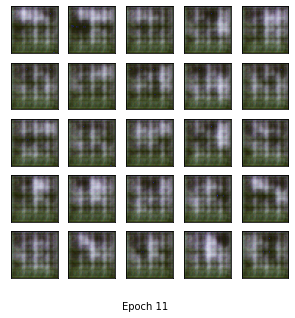

[12/100] - ptime: 2.00, loss_d: -0.006, loss_g: -0.001


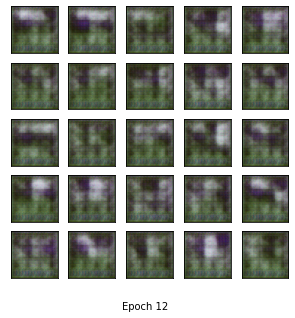

[13/100] - ptime: 2.16, loss_d: -0.008, loss_g: 0.000


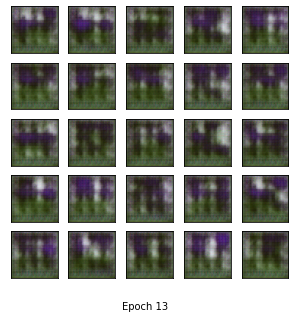

[14/100] - ptime: 2.17, loss_d: -0.008, loss_g: 0.001


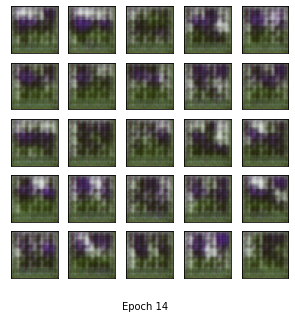

[15/100] - ptime: 2.06, loss_d: -0.011, loss_g: 0.004


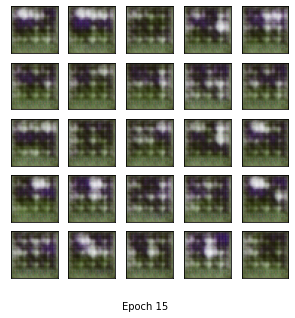

[16/100] - ptime: 2.06, loss_d: -0.020, loss_g: 0.011


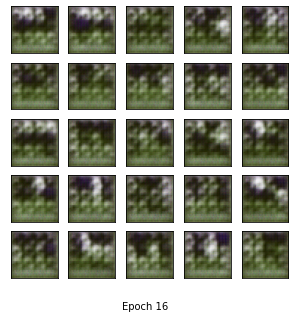

[17/100] - ptime: 2.05, loss_d: -0.050, loss_g: 0.015


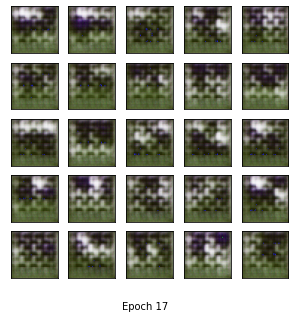

[18/100] - ptime: 2.14, loss_d: -0.075, loss_g: 0.040


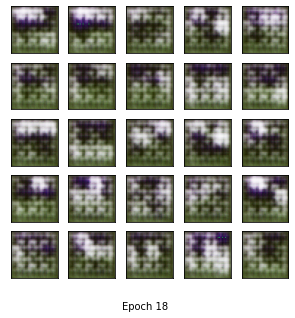

[19/100] - ptime: 2.13, loss_d: -0.101, loss_g: 0.042


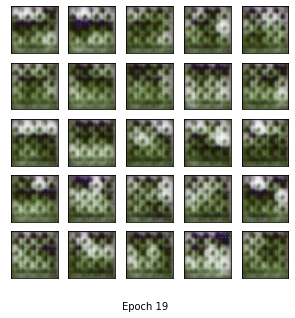

[20/100] - ptime: 2.09, loss_d: -0.125, loss_g: 0.072


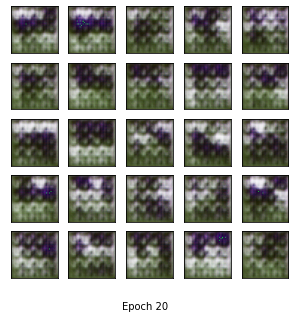

[21/100] - ptime: 2.16, loss_d: -0.116, loss_g: 0.070


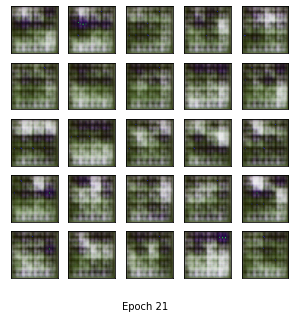

[22/100] - ptime: 2.07, loss_d: -0.117, loss_g: 0.076


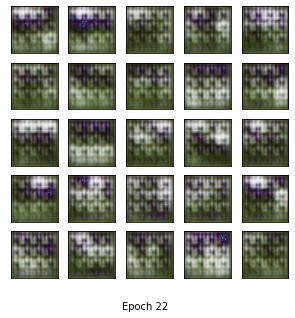

[23/100] - ptime: 2.08, loss_d: -0.122, loss_g: 0.091


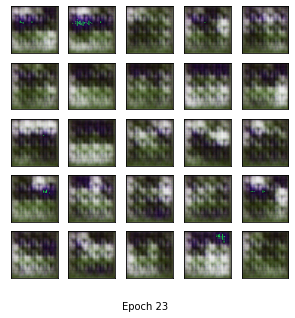

[24/100] - ptime: 2.20, loss_d: -0.164, loss_g: 0.104


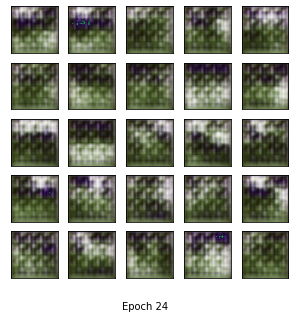

[25/100] - ptime: 1.97, loss_d: -0.161, loss_g: 0.090


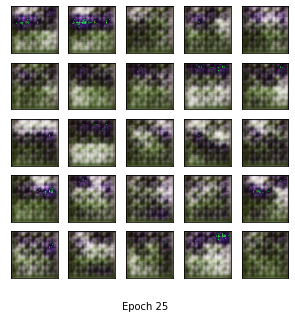

[26/100] - ptime: 2.13, loss_d: -0.188, loss_g: 0.103


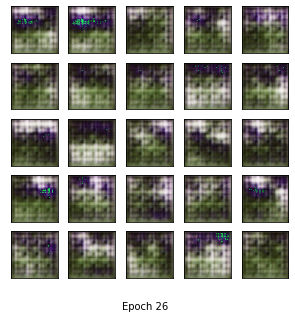

[27/100] - ptime: 2.17, loss_d: -0.171, loss_g: 0.106


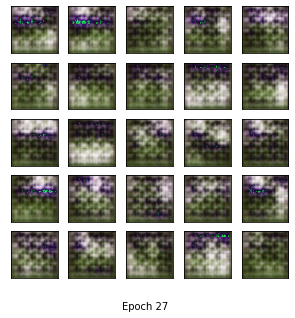

[28/100] - ptime: 2.14, loss_d: -0.188, loss_g: 0.107


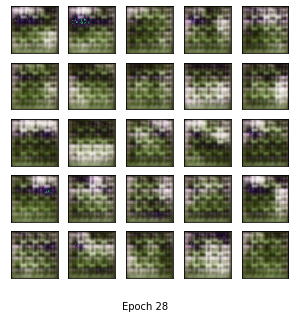

[29/100] - ptime: 2.18, loss_d: -0.175, loss_g: 0.104


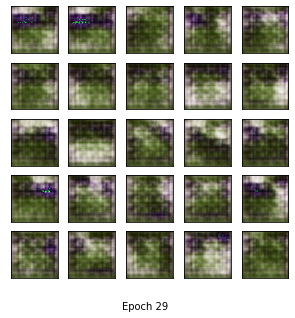

[30/100] - ptime: 2.13, loss_d: -0.166, loss_g: 0.094


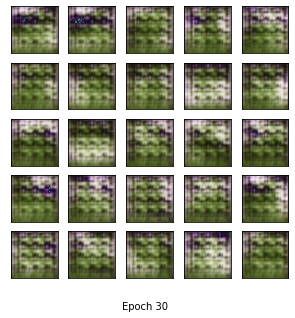

[31/100] - ptime: 2.22, loss_d: -0.180, loss_g: 0.111


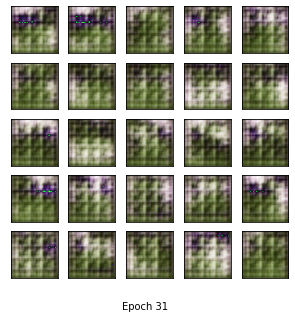

[32/100] - ptime: 2.13, loss_d: -0.211, loss_g: 0.114


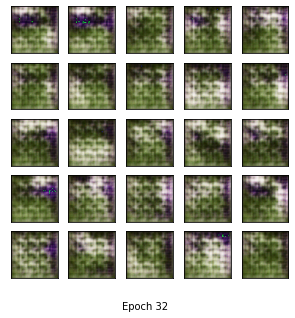

[33/100] - ptime: 2.18, loss_d: -0.176, loss_g: 0.104


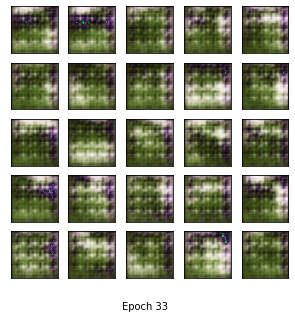

[34/100] - ptime: 2.14, loss_d: -0.212, loss_g: 0.093


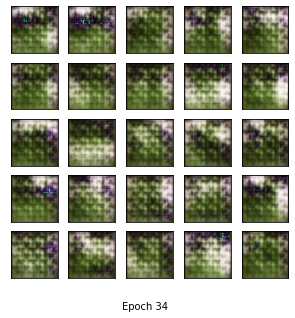

[35/100] - ptime: 2.21, loss_d: -0.197, loss_g: 0.119


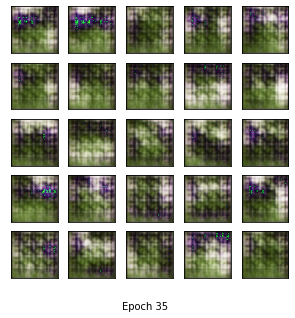

[36/100] - ptime: 2.14, loss_d: -0.188, loss_g: 0.105


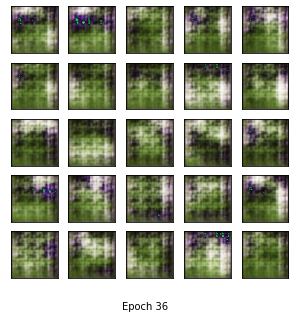

[37/100] - ptime: 2.20, loss_d: -0.180, loss_g: 0.121


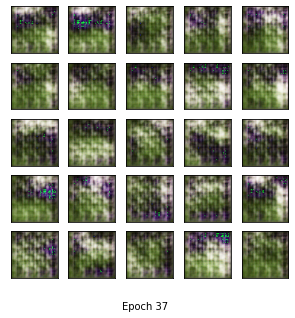

[38/100] - ptime: 2.20, loss_d: -0.205, loss_g: 0.115


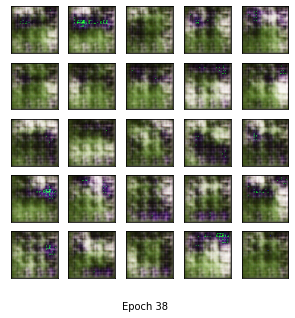

[39/100] - ptime: 2.00, loss_d: -0.214, loss_g: 0.099


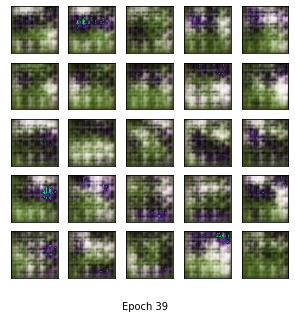

[40/100] - ptime: 2.06, loss_d: -0.221, loss_g: 0.112


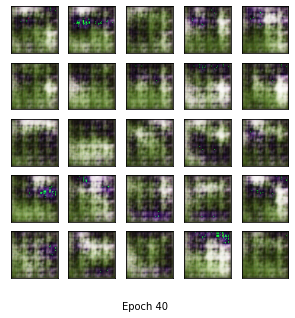

[41/100] - ptime: 2.19, loss_d: -0.175, loss_g: 0.111


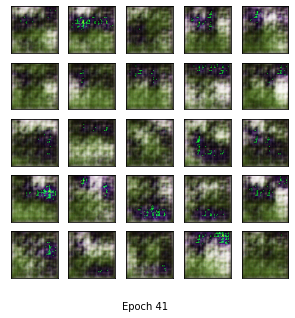

[42/100] - ptime: 2.24, loss_d: -0.220, loss_g: 0.123


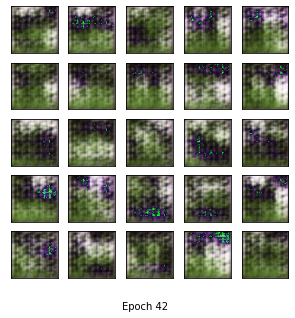

[43/100] - ptime: 2.14, loss_d: -0.215, loss_g: 0.110


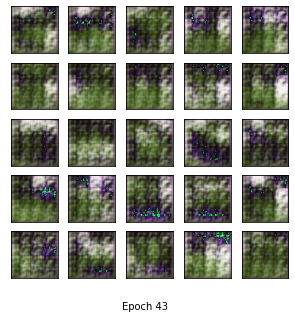

[44/100] - ptime: 2.17, loss_d: -0.199, loss_g: 0.104


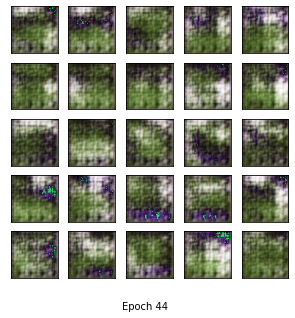

[45/100] - ptime: 2.23, loss_d: -0.207, loss_g: 0.112


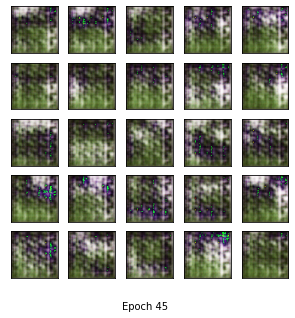

[46/100] - ptime: 2.10, loss_d: -0.233, loss_g: 0.119


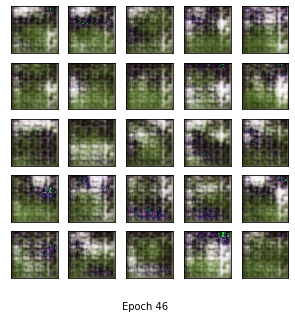

[47/100] - ptime: 2.14, loss_d: -0.159, loss_g: 0.064


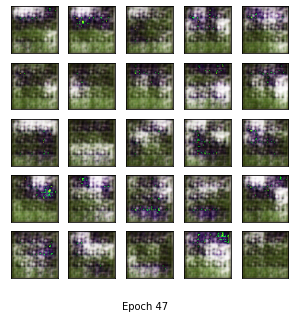

[48/100] - ptime: 2.16, loss_d: -0.175, loss_g: 0.105


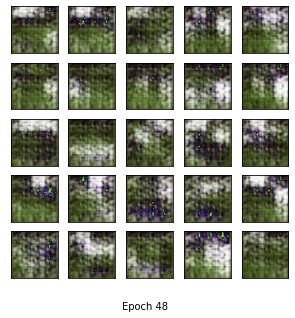

[49/100] - ptime: 2.18, loss_d: -0.203, loss_g: 0.121


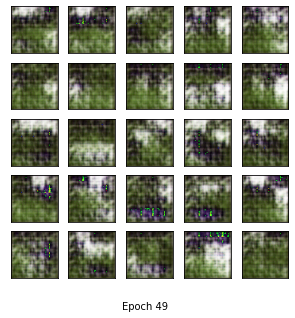

[50/100] - ptime: 2.10, loss_d: -0.160, loss_g: 0.112


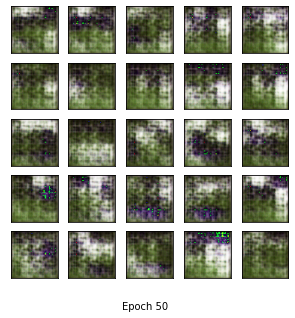

[51/100] - ptime: 2.27, loss_d: -0.203, loss_g: 0.124


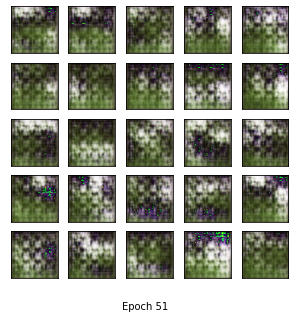

[52/100] - ptime: 2.21, loss_d: -0.225, loss_g: 0.118


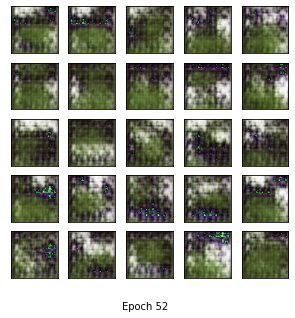

[53/100] - ptime: 2.12, loss_d: -0.178, loss_g: 0.114


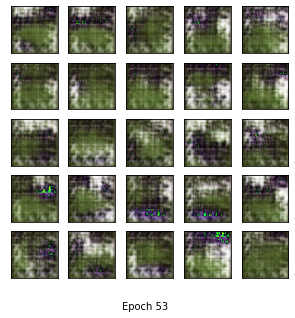

[54/100] - ptime: 2.19, loss_d: -0.231, loss_g: 0.120


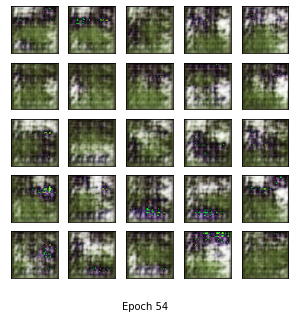

[55/100] - ptime: 2.10, loss_d: -0.207, loss_g: 0.110


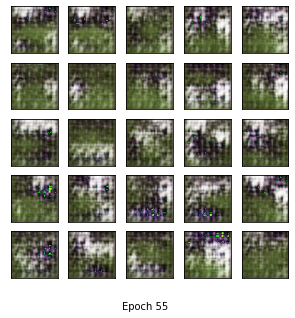

[56/100] - ptime: 2.19, loss_d: -0.214, loss_g: 0.117


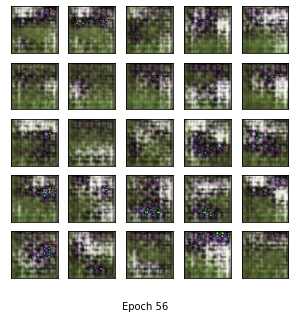

[57/100] - ptime: 2.16, loss_d: -0.206, loss_g: 0.078


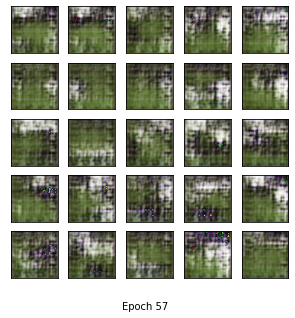

[58/100] - ptime: 2.21, loss_d: -0.208, loss_g: 0.122


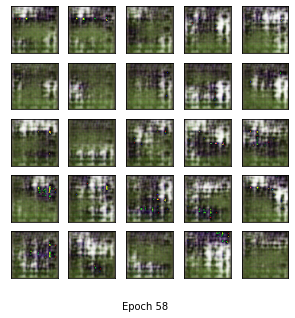

[59/100] - ptime: 2.15, loss_d: -0.183, loss_g: 0.107


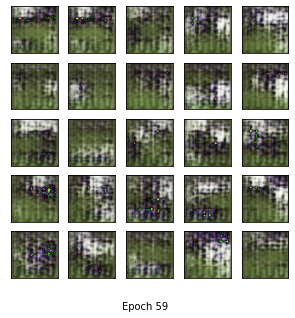

[60/100] - ptime: 2.20, loss_d: -0.226, loss_g: 0.101


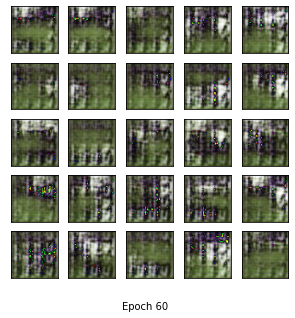

[61/100] - ptime: 2.21, loss_d: -0.167, loss_g: 0.120


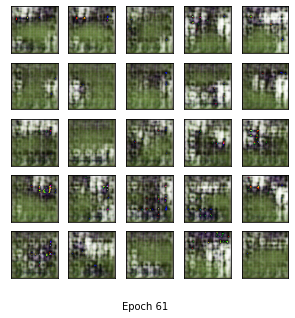

[62/100] - ptime: 2.12, loss_d: -0.174, loss_g: 0.106


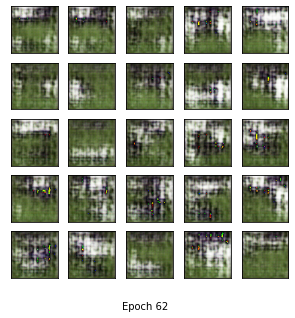

[63/100] - ptime: 2.16, loss_d: -0.192, loss_g: 0.102


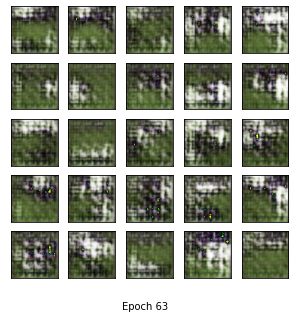

[64/100] - ptime: 2.19, loss_d: -0.175, loss_g: 0.076


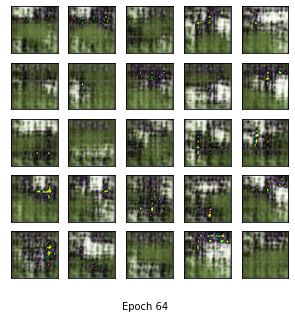

[65/100] - ptime: 2.20, loss_d: -0.189, loss_g: 0.100


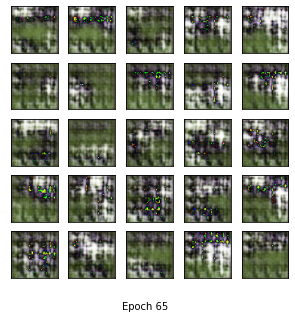

[66/100] - ptime: 2.21, loss_d: -0.154, loss_g: 0.114


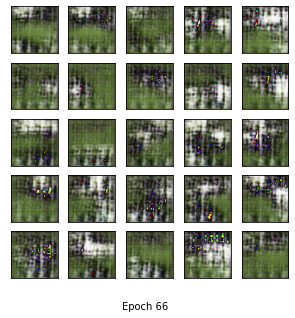

[67/100] - ptime: 2.15, loss_d: -0.171, loss_g: 0.106


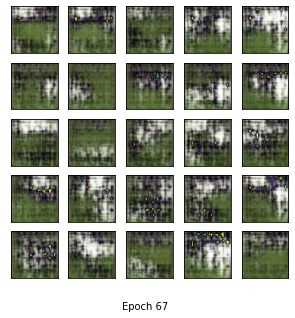

[68/100] - ptime: 2.19, loss_d: -0.133, loss_g: 0.121


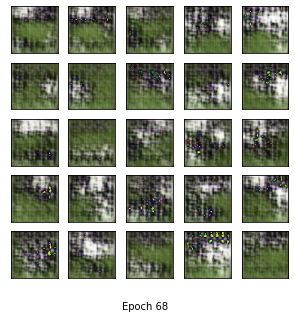

[69/100] - ptime: 2.22, loss_d: -0.158, loss_g: 0.034


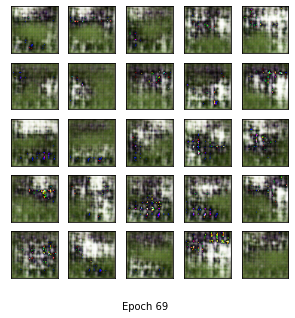

[70/100] - ptime: 2.16, loss_d: -0.194, loss_g: 0.107


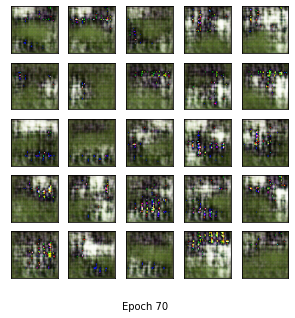

[71/100] - ptime: 2.21, loss_d: -0.187, loss_g: 0.110


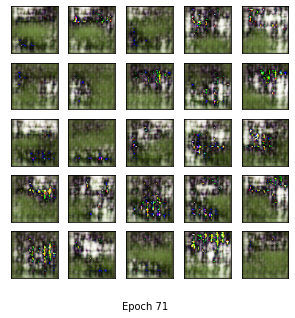

[72/100] - ptime: 2.18, loss_d: -0.126, loss_g: 0.070


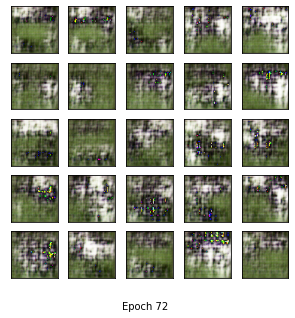

[73/100] - ptime: 2.21, loss_d: -0.141, loss_g: 0.100


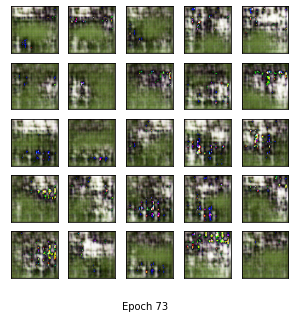

[74/100] - ptime: 2.08, loss_d: -0.109, loss_g: 0.118


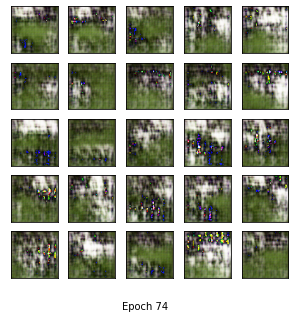

[75/100] - ptime: 2.22, loss_d: -0.168, loss_g: 0.095


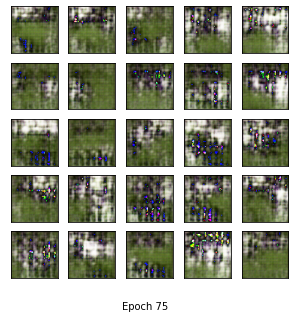

[76/100] - ptime: 2.13, loss_d: -0.163, loss_g: 0.079


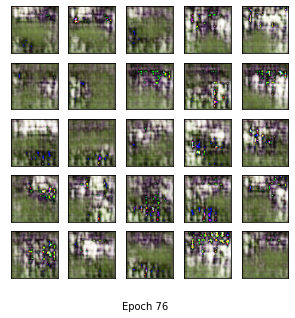

[77/100] - ptime: 2.24, loss_d: -0.143, loss_g: 0.088


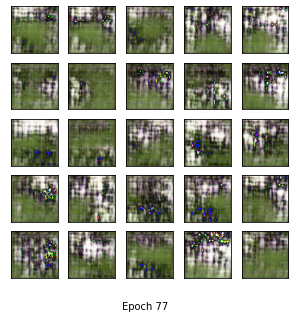

[78/100] - ptime: 2.24, loss_d: -0.172, loss_g: 0.106


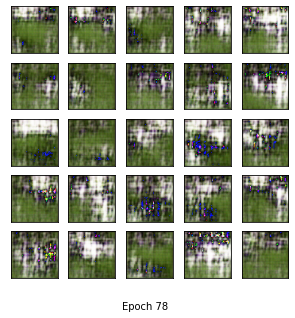

[79/100] - ptime: 2.22, loss_d: -0.151, loss_g: 0.077


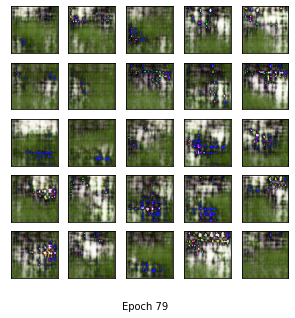

[80/100] - ptime: 2.13, loss_d: -0.156, loss_g: 0.072


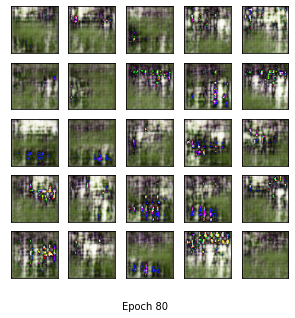

[81/100] - ptime: 2.23, loss_d: -0.207, loss_g: 0.103


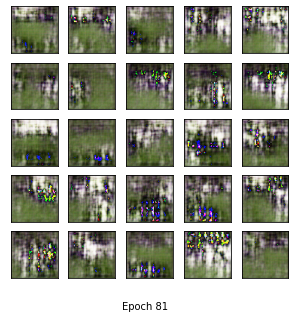

[82/100] - ptime: 2.23, loss_d: -0.128, loss_g: 0.123


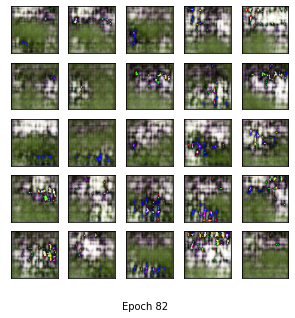

[83/100] - ptime: 2.26, loss_d: -0.119, loss_g: 0.051


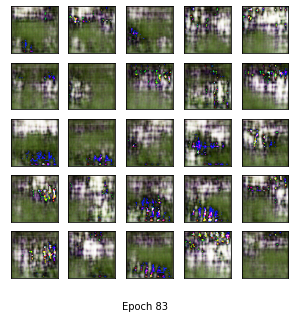

[84/100] - ptime: 2.17, loss_d: -0.164, loss_g: 0.051


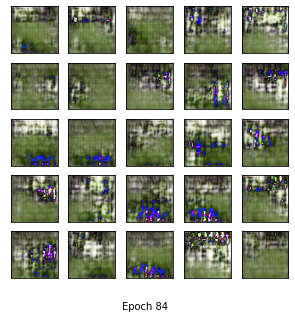

[85/100] - ptime: 2.26, loss_d: -0.159, loss_g: 0.038


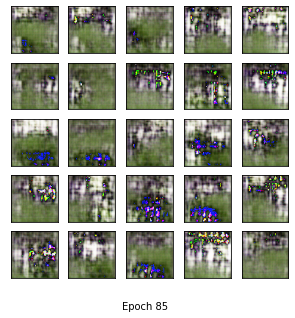

[86/100] - ptime: 2.11, loss_d: -0.180, loss_g: 0.073


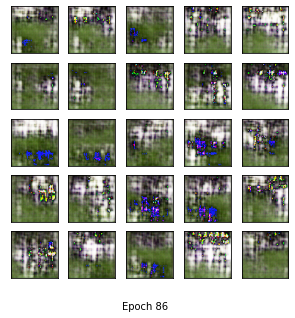

[87/100] - ptime: 2.20, loss_d: -0.125, loss_g: 0.076


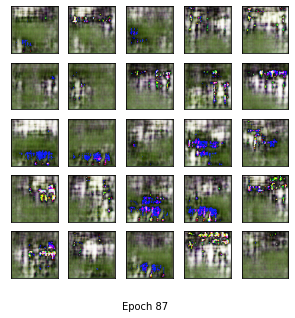

[88/100] - ptime: 2.23, loss_d: -0.145, loss_g: 0.027


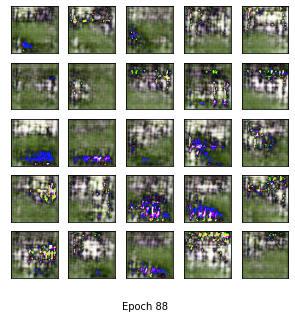

[89/100] - ptime: 2.24, loss_d: -0.167, loss_g: 0.096


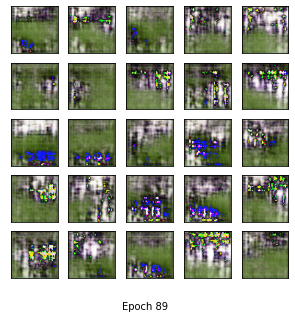

[90/100] - ptime: 2.25, loss_d: -0.141, loss_g: 0.090


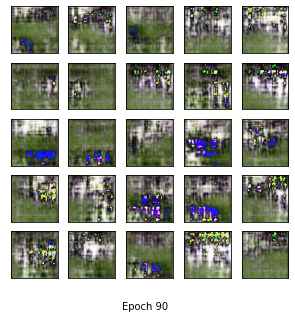

[91/100] - ptime: 2.24, loss_d: -0.137, loss_g: 0.096


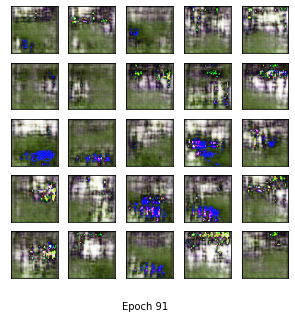

[92/100] - ptime: 2.25, loss_d: -0.109, loss_g: 0.079


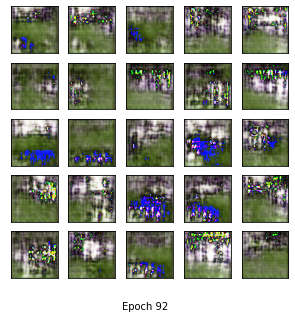

[93/100] - ptime: 2.26, loss_d: -0.159, loss_g: 0.091


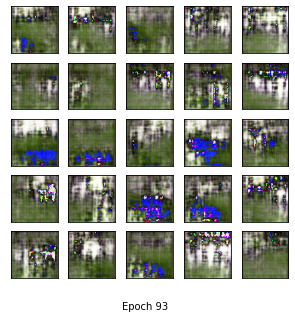

[94/100] - ptime: 2.25, loss_d: -0.114, loss_g: 0.113


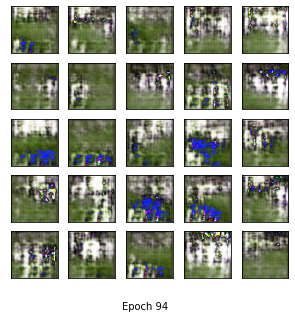

[95/100] - ptime: 2.15, loss_d: -0.138, loss_g: 0.105


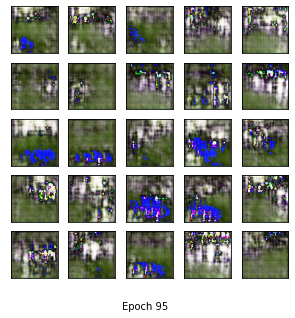

[96/100] - ptime: 2.16, loss_d: -0.141, loss_g: 0.102


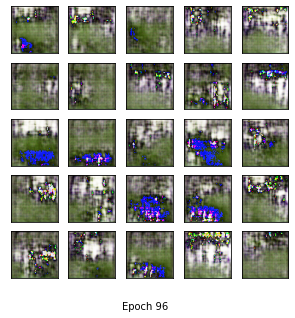

[97/100] - ptime: 2.10, loss_d: -0.141, loss_g: 0.045


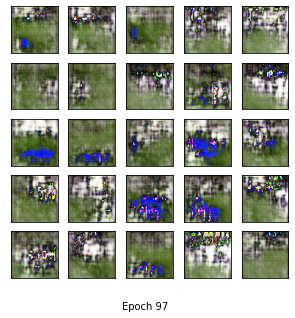

[98/100] - ptime: 2.09, loss_d: -0.160, loss_g: 0.097


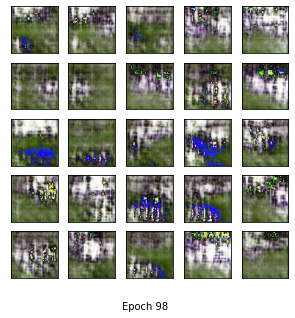

[99/100] - ptime: 2.16, loss_d: -0.112, loss_g: 0.049


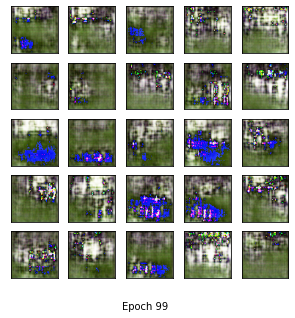

[100/100] - ptime: 2.23, loss_d: -0.185, loss_g: 0.086


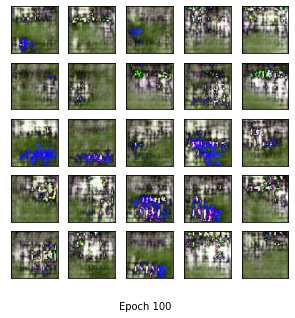

Avg per epoch ptime: 2.15, total 100 epochs ptime: 430.50
Training finish!... save training results


In [ ]:
train_hist = {}
train_hist['D_losses'] = []
train_hist['G_losses'] = []
train_hist['per_epoch_ptimes'] = []
train_hist['total_ptime'] = []
num_iter = 0


print('training start!')
start_time = time.time()
for epoch in range(train_epoch):

    gen.train()
    critic.train()
    

    D_losses = []
    G_losses = []
    epoch_start_time = time.time()

    for x_, _ in train_loaders['train']:
      data = x_.to(device)
      current_batch_size = data.shape[0]

      # Train Critic
      for _ in range(5):
        noise = torch.randn(current_batch_size, 100).view(-1, 100, 1, 1).to(device)
        #print(noise.shape)

        fake = gen(noise)

        critic_real = critic(data).reshape(-1)
        critic_fake = critic(fake).reshape(-1)

        loss_critic = -(torch.mean(critic_real) - torch.mean(critic_fake)).to(device)
        critic.zero_grad()

        loss_critic.backward(retain_graph = True)
        opt_critic.step()

        # clip critic weights

        for p in critic.parameters():
          p.data.clamp_(-0.01, 0.01)

      #TRAIN GENERATOR
      gen_fake = critic(fake).reshape(-1)
      loss_gen = -torch.mean(gen_fake).to(device)

      gen.zero_grad()
      loss_gen.backward()
      opt_gen.step()
  
    epoch_end_time = time.time()
    per_epoch_ptime = epoch_end_time - epoch_start_time

    print('[%d/%d] - ptime: %.2f, loss_d: %.3f, loss_g: %.3f' % ((epoch + 1), train_epoch, per_epoch_ptime, loss_critic,
                                                                loss_gen))

    p = 'WGAN_results/Random_results/WGAN_' + str(epoch + 1) + '.png'
    fixed_p = 'WGAN_results/Fixed_results/WGAN_' + str(epoch + 1) + '.png'
    show_result((epoch+1), save=True, path=p, isFix=False)
    show_result((epoch+1), show = True, save=True, path=fixed_p, isFix=True)
    train_hist['D_losses'].append(loss_critic)
    train_hist['G_losses'].append(loss_gen)
    train_hist['per_epoch_ptimes'].append(per_epoch_ptime)

end_time = time.time()
total_ptime = end_time - start_time
train_hist['total_ptime'].append(total_ptime)

print("Avg per epoch ptime: %.2f, total %d epochs ptime: %.2f" % (torch.mean(torch.FloatTensor(train_hist['per_epoch_ptimes'])), train_epoch, total_ptime))
print("Training finish!... save training results")
torch.save(gen.state_dict(), "WGAN_results/generator_param.pkl")
torch.save(critic.state_dict(), "WGAN_results/critc_param.pkl")
with open('WGAN_results/train_hist.pkl', 'wb') as f:
    pickle.dump(train_hist, f)

show_train_hist(train_hist, save=True, path='WGAN_results/WGAN_train_hist.png')

images = []
for e in range(train_epoch):
    img_name = 'WGAN_results/Fixed_results/WGAN_' + str(e + 1) + '.png'
    images.append(imageio.imread(img_name))
imageio.mimsave('WGAN_results/generation_animation.gif', images, fps=5)
